# Artificial Neural Networks and Deep Learning











---











# Homework 1

## ⚙️ Import Libraries

In [1]:
import numpy as np
import tensorflow as tf
import seaborn as sns
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score,
)
import matplotlib.gridspec as gridspec
import keras
import keras_cv
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

## ⏳ Load the Data

In [2]:
# Load Data
# data = np.load('clean_data.npz')
data = np.load("/kaggle/input/clean-set/clean_data.npz")
X = data["images"]
y = data["labels"]
np.unique(y, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=uint8),
 array([ 852, 2181, 1085, 2026,  849,  993, 2330, 1643]))

In [3]:
# Labels dictionary
labels_dict = {
    0: "Basophil",
    1: "Eosinophil",
    2: "Erythroblast",
    3: "Immature granulocytes",
    4: "Lymphocyte",
    5: "Monocyte",
    6: "Neutrophil",
    7: "Platelet",
}

In [4]:
class_count = {}

for i in labels_dict:
    class_count[i] = np.unique(y, return_counts=True)[1][i]

class_count

{0: 852, 1: 2181, 2: 1085, 3: 2026, 4: 849, 5: 993, 6: 2330, 7: 1643}

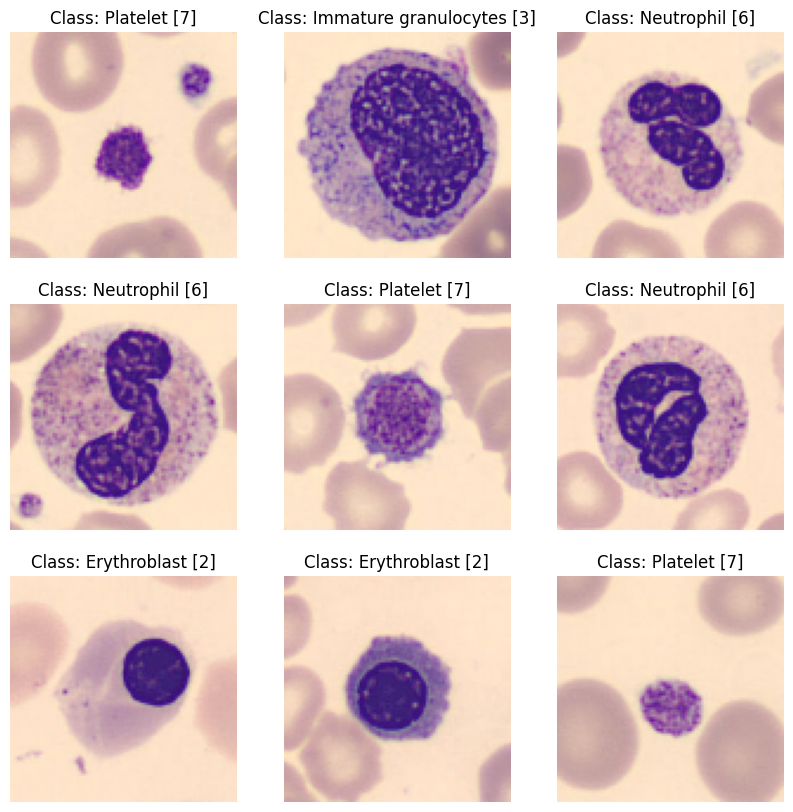

In [5]:
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
axs = axs.reshape((-1,))

for i in range(9):
    axs[i].imshow(X[i])
    axs[i].set_title(f"Class: {labels_dict[y[i][0]]} {y[i]}")
    axs[i].axis("off")


## 🔄 Process Data


In [6]:
# Convert labels to categorical format using one-hot encoding
y = tfk.utils.to_categorical(y)

test_val_size = 0.05 # parameter to tune

# Split data into train_val and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, random_state=seed, test_size=test_val_size, stratify=np.argmax(y,axis=1))

# Further split train_val into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, random_state=seed, test_size=len(X_test), stratify=np.argmax(y_train_val,axis=1))

# Print shapes of the datasets
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

X_train shape: (10763, 96, 96, 3), y_train shape: (10763, 8)
X_val shape: (598, 96, 96, 3), y_val shape: (598, 8)
X_test shape: (598, 96, 96, 3), y_test shape: (598, 8)


## 🧮 Define Network Parameters


In [7]:
# Input shape for the model
input_shape = X_train.shape[1:]

# Output shape for the model
output_shape = y_train.shape[1]

print("Input Shape:", input_shape)
print("Output Shape:", output_shape)

Input Shape: (96, 96, 3)
Output Shape: 8


In [8]:
#Number of training epochs
epochs = 15 # parameter to tune

# Batch size for training
batch_size = 64 # parameter to tune

# Learning rate: step size for updating the model's weights
learning_rate = 0.001 # parameter to tune

# Print the defined parameters
print("Epochs:", epochs)
print("Batch Size:", batch_size)
print("Learning Rate:", learning_rate)

Epochs: 15
Batch Size: 64
Learning Rate: 0.001


## Data Augmentation

In [9]:
def total_augmentation(images, labels):
    # We don't want to mix all the random augmentations with cutMix, FourierMix and MixUp so we will apply some combinations
    # In the end, we will have the following data in our dataset:
    # 1. Clean data
    # 2. Clean + Random augmentation data
    # 3. Clean + cutMix
    # 4. Clean + FourierMix
    images = tf.convert_to_tensor(images, dtype=tf.float32)
    labels = tf.convert_to_tensor(np.array(labels, dtype=np.float32))  

    # Apply random augmentation
    rand_augment = keras_cv.layers.RandAugment(value_range=(0, 1), augmentations_per_image=3, magnitude=0.5)
    random_aug = rand_augment(images)
    
    # Apply CutMix
    cutmix = keras_cv.layers.CutMix()
    output = cutmix({"images": images, "labels": labels})
    cutmix_images = output['images']
    cutmix_labels = output['labels']

    # Apply FourierMix
    fouriermix = keras_cv.layers.FourierMix(0.5)
    output = fouriermix({"images": images, "labels": labels})
    fourier_images=output['images']
    fourier_labels=output['labels']
    
    # Combine all the data
    total_aug_images = np.concatenate((images, random_aug, cutmix_images, fourier_images), axis=0)
    total_aug_labels = np.concatenate((labels, labels, cutmix_labels, fourier_labels ), axis=0)

    # Shuffle the training data
    indices = np.random.permutation(total_aug_labels.shape[0])
    shuffled_images = total_aug_images[indices]
    shuffled_labels = total_aug_labels[indices]

    del output
    del images
    del labels
    del random_aug
    del cutmix_images
    del cutmix_labels
    del fourier_images
    del fourier_labels
    
    return shuffled_images, shuffled_labels

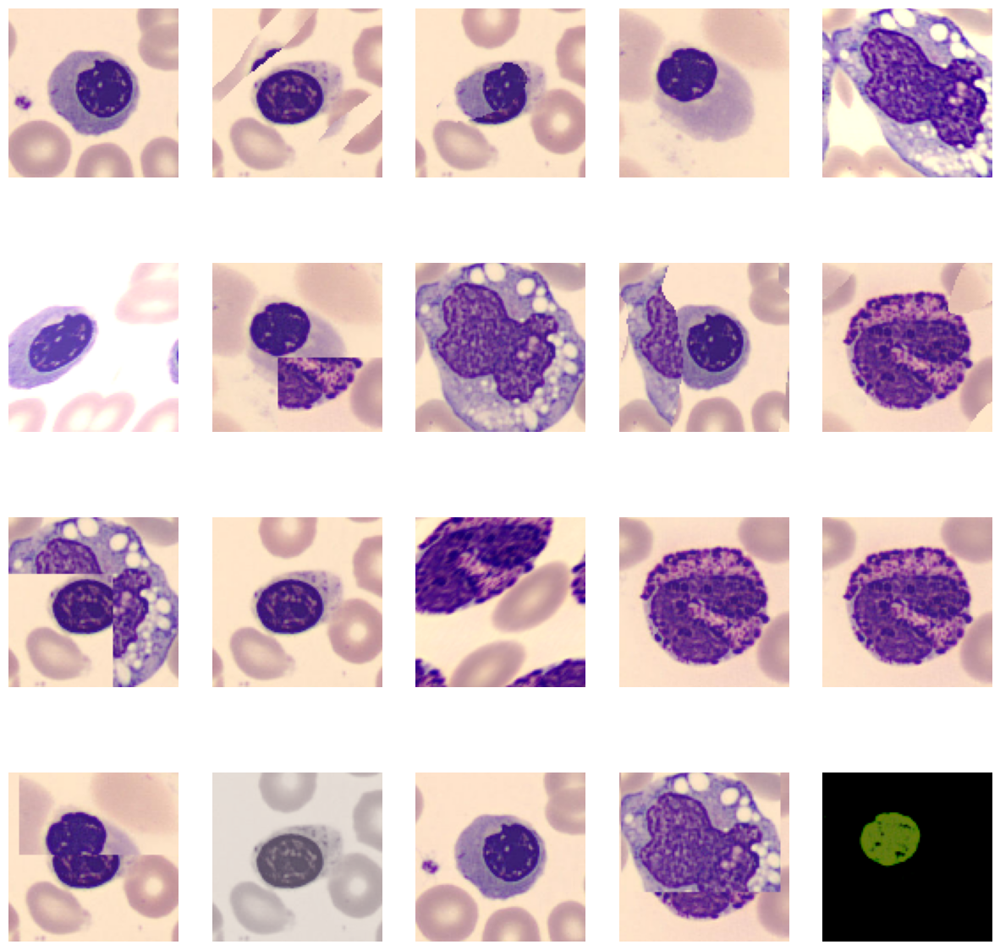

In [10]:
# Let's visualize the augmentation with 5 images
sample_images = X_train[:5]  
sample_labels = y_train[:5]

sample_aug_images, sample_aug_labels = total_augmentation(sample_images, sample_labels)

# Visualize sample augmentations
fig, axs = plt.subplots(4, 5, figsize=(15, 15))
axs = axs.reshape((-1,))
for i in range(20):
    axs[i].imshow(sample_aug_images[i])
    axs[i].axis("off")


In [11]:
# Now, let's apply this to the whole dataset!
aug_images, aug_labels = total_augmentation(X_train, y_train)

## 🛠️ Build the Model

1393257616/1393257616 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


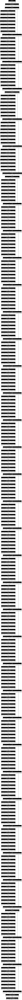

In [12]:
model_large = keras.applications.ConvNeXtXLarge(
    include_top=False, #can change this
    include_preprocessing=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=input_shape,
    pooling="avg", #can change this
    classes=8,
    classifier_activation="softmax"    
)
tfk.utils.plot_model(model_large, show_shapes=True)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Augmentation (Sequential)       │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_flip (RandomFlip)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_translation_4       │ (None, 96, 96, 3)      │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_rotation            │ (None, 96, 96, 3)      │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_zoom (RandomZoom)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_xlarge (Functional)    │ (None, 2048)           │   348,147,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer (InputLayer)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 96, 96, 3)      │             0 │
│ convnext_xlarge_prestem_normal… │                        │               │
│ (Normalization)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ convnext_xlarge_stem       │ (None, 24, 24, 256)    │        13,056 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│       └                         │ (None, 24, 24, 256)    │        12,544 │
│ convnext_xlarge_stem_conv       │                        │               │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│       └                         │ (None, 24, 24, 256)    │           512 │
│ convnext_xlarge_stem_layernorm  │                        │               │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 256)    │        12,800 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 256)    │           512 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 1024)   │       263,168 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 1024)   │             0 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 349,374,088 (1.30 GB)

 Trainable params: 1,220,232 (4.65 MB)

 Non-trainable params: 348,153,856 (1.30 GB)

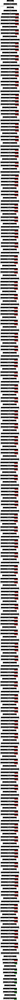

In [13]:
model_large.trainable = False #Freeze the weights of the CNN
tf.random.set_seed(seed)

# Create an input layer with shape (96, 96, 3)
inputs = tfk.Input(shape=(96, 96, 3), name='input_layer')

augmentation = tf.keras.Sequential([
    tfkl.RandomFlip("horizontal_and_vertical"),
    tfkl.RandomTranslation(0.2,0.2),
    tfkl.RandomRotation(0.2),
    tfkl.RandomZoom(0.2),
], name='Augmentation')

x = augmentation(inputs)

# Connect ConvNeXtXLarge to the input
x = model_large(x)

###################################################################################################
# Adding additional layers here
x = tfkl.BatchNormalization()(x)
x = tfkl.Dropout(0.5)(x)

x = tfkl.Dense(512, activation='relu', name='dense1')(x)
x = tfkl.BatchNormalization()(x)
x = tfkl.Dropout(0.5)(x)

x = tfkl.Dense(256, activation='relu', name='dense2')(x)
x = tfkl.BatchNormalization()(x)
x = tfkl.Dropout(0.5)(x)

x = tfkl.Dense(128, activation='relu', name='dense3')(x)
x = tfkl.BatchNormalization()(x)
x = tfkl.Dropout(0.5)(x)
###################################################################################################
# Add a Dense layer with 8 units and softmax activation as the classifier
outputs = tfkl.Dense(y_train.shape[-1], activation='softmax', name='dense')(x)

# Create a Model connecting input and output
model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with Categorical Cross-Entropy loss and Adam optimizer
model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.AdamW(learning_rate), metrics=['accuracy'])

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

## 🛠️ Train and Save the Model

In [14]:
# Define the patience value for early stopping
patience = 5 # parameter to tune

# Create an EarlyStopping callback
early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=patience,
    restore_best_weights=True
)

reduce_lr = tfk.callbacks.ReduceLROnPlateau(
    monitor="val_loss", factor=0.5, patience=patience, min_lr=1e-6, verbose=1
)
# Store the callback in a list
callbacks = [early_stopping, reduce_lr]

In [15]:
aug_images.shape,aug_labels.shape

((43052, 96, 96, 3), (43052, 8))

In [16]:
# Train the model with early stopping callback
history = model.fit(
    x=aug_images*255, #The model takes inputs in the range 0-255 
    y=aug_labels,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val*255, y_val),
    callbacks=callbacks
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'model_large.keras'
model.save(model_filename)

# Delete the model to free up resources
del model

Epoch 1/15


I0000 00:00:1732219654.404739      69 service.cc:145] XLA service 0x7ed4751aa770 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732219654.404793      69 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1732219654.826423      69 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


673/673 ━━━━━━━━━━━━━━━━━━━━ 1050s 2s/step - accuracy: 0.5115 - loss: 1.6396 - val_accuracy: 0.9231 - val_loss: 0.2230 - learning_rate: 0.0010
Epoch 2/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1025s 2s/step - accuracy: 0.7288 - loss: 0.9460 - val_accuracy: 0.9515 - val_loss: 0.1724 - learning_rate: 0.0010
Epoch 3/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1024s 2s/step - accuracy: 0.7548 - loss: 0.8779 - val_accuracy: 0.9515 - val_loss: 0.1673 - learning_rate: 0.0010
Epoch 4/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1025s 2s/step - accuracy: 0.7610 - loss: 0.8513 - val_accuracy: 0.9565 - val_loss: 0.1576 - learning_rate: 0.0010
Epoch 5/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1025s 2s/step - accuracy: 0.7726 - loss: 0.8250 - val_accuracy: 0.9615 - val_loss: 0.1499 - learning_rate: 0.0010
Epoch 6/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1024s 2s/step - accuracy: 0.7730 - loss: 0.8161 - val_accuracy: 0.9599 - val_loss: 0.1400 - learning_rate: 0.0010
Epoch 7/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1025s 2s/step - accuracy: 0.7775 - loss: 0.8054

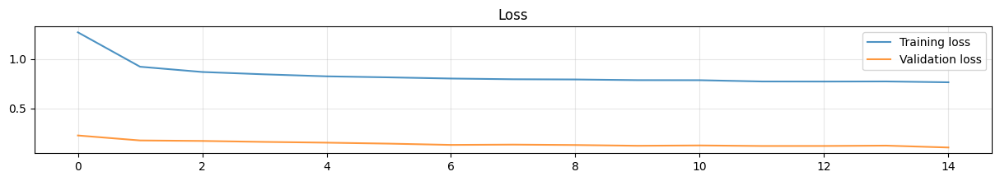

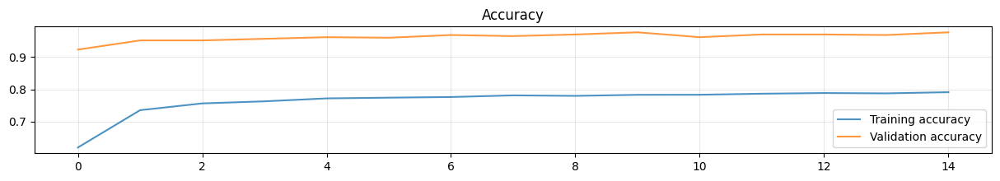

In [17]:
# Plot training and validation loss

plt.figure(figsize=(15, 2))
plt.plot(history["loss"], label="Training loss", alpha=0.8)
plt.plot(history["val_loss"], label="Validation loss", alpha=0.8)
plt.title("Loss")
plt.legend()
plt.grid(alpha=0.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history["accuracy"], label="Training accuracy", alpha=0.8)
plt.plot(history["val_accuracy"], label="Validation accuracy", alpha=0.8)
plt.title("Accuracy")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

## 🕹️ Use the Model - Make Inference

In [18]:
# Load the saved model
# model = tfk.models.load_model('cell.keras')

model = tfk.models.load_model('/kaggle/working/model_large.keras')

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer (InputLayer)    │ (None, 96, 96, 3)     │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ Augmentation (Sequential)   │ (None, 96, 96, 3)     │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_flip            │ (None, 96, 96, 3)     │          0 │   -   │
│ (RandomFlip)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_translation_4   │ (None, 96, 96, 3)     │          0 │   -   │
│ (RandomTranslation)         │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_rotation        │ (None, 96, 96, 3)     │          0 │   -   │
│ (RandomRotation)            │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_zoom            │ (None, 96, 96, 3)     │          0 │   -   │
│ (RandomZoom)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ convnext_xlarge             │ (None, 2048)          │ 348,147,9… │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ input_layer            │ (None, 96, 96, 3)     │          0 │   -   │
│ (InputLayer)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 96, 96, 3)     │          0 │   -   │
│ convnext_xlarge_prestem_no… │                       │            │       │
│ (Normalization)             │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ convnext_xlarge_stem   │ (None, 24, 24, 256)   │     13,056 │   Y   │
│ (Sequential)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│       └                     │ (None, 24, 24, 256)   │     12,544 │   N   │
│ convnext_xlarge_stem_conv   │                       │            │       │
│ (Conv2D)                    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│       └                     │ (None, 24, 24, 256)   │        512 │   N   │
│ convnext_xlarge_stem_layer… │                       │            │       │
│ (LayerNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 24, 24, 256)   │     12,800 │   N   │
│ convnext_xlarge_stage_0_bl… │                       │            │       │
│ (Conv2D)                    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 24, 24, 256)   │        512 │   N   │
│ convnext_xlarge_stage_0_bl… │                       │            │       │
│ (LayerNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 24, 24, 1024)  │    263,168 │   N   │
│ convnext_xlarge_stage_0_bl… │                       │            │       │
│ (Dense)                     │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼─────

 Total params: 351,814,554 (1.31 GB)

 Trainable params: 1,220,232 (4.65 MB)

 Non-trainable params: 348,153,856 (1.30 GB)

 Optimizer params: 2,440,466 (9.31 MB)

598
Accuracy score over the test set: 0.9666
Precision score over the test set: 0.9677
Recall score over the test set: 0.9666
F1 score over the test set: 0.9667


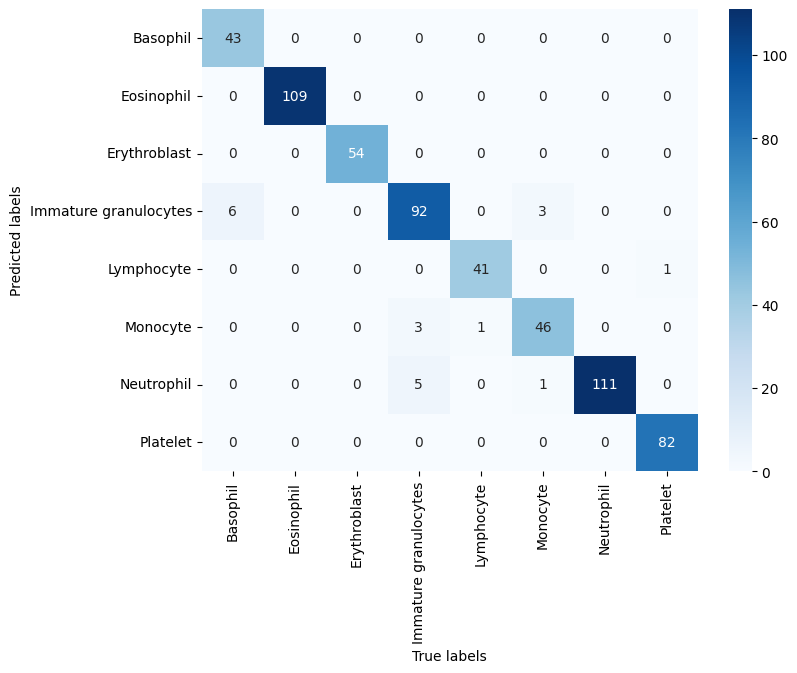

In [19]:
# Predict class probabilities and get predicted classes

test_predictions = model.predict(X_test*255, verbose=0)
print(len(test_predictions))
test_predictions = np.argmax(test_predictions, axis=-1)

# Extract ground truth classes
test_gt = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
test_accuracy = accuracy_score(test_gt, test_predictions)
print(f"Accuracy score over the test set: {round(test_accuracy, 4)}")

# Calculate and display test set precision
test_precision = precision_score(test_gt, test_predictions, average="weighted")
print(f"Precision score over the test set: {round(test_precision, 4)}")

# Calculate and display test set recall
test_recall = recall_score(test_gt, test_predictions, average="weighted")
print(f"Recall score over the test set: {round(test_recall, 4)}")

# Calculate and display test set F1 score
test_f1 = f1_score(test_gt, test_predictions, average="weighted")
print(f"F1 score over the test set: {round(test_f1, 4)}")

# Compute the confusion matrix
cm = confusion_matrix(test_gt, test_predictions)

# Create labels combining confusion matrix values
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix with class labels
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm,
    annot=labels,
    fmt="",
    xticklabels=list(labels_dict.values()),
    yticklabels=list(labels_dict.values()),
    cmap="Blues",
)

plt.xlabel("True labels")
plt.ylabel("Predicted labels")
plt.show()

## 🛠️ Fine Tuning

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Augmentation (Sequential)       │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_flip (RandomFlip)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_translation_4       │ (None, 96, 96, 3)      │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_rotation            │ (None, 96, 96, 3)      │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_zoom (RandomZoom)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_xlarge (Functional)    │ (None, 2048)           │   348,147,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer (InputLayer)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 96, 96, 3)      │             0 │
│ convnext_xlarge_prestem_normal… │                        │               │
│ (Normalization)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ convnext_xlarge_stem       │ (None, 24, 24, 256)    │        13,056 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│       └                         │ (None, 24, 24, 256)    │        12,544 │
│ convnext_xlarge_stem_conv       │                        │               │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│       └                         │ (None, 24, 24, 256)    │           512 │
│ convnext_xlarge_stem_layernorm  │                        │               │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 256)    │        12,800 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 256)    │           512 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 1024)   │       263,168 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 1024)   │             0 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 351,814,554 (1.31 GB)

 Trainable params: 1,220,232 (4.65 MB)

 Non-trainable params: 348,153,856 (1.30 GB)

 Optimizer params: 2,440,466 (9.31 MB)

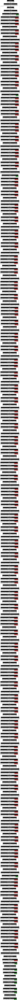

In [20]:
# Re-load the model after transfer learning

ft_model = model #tfk.models.load_model('/kaggle/input/model_81/keras/default/1/model_large.keras')

# Display a summary of the model architecture
ft_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [21]:
# Set the ConvNeXtXLarge model layers as trainable
ft_model.get_layer('convnext_xlarge').trainable = True

# Set all ConvNeXtXLarge layers as non-trainable
for layer in ft_model.get_layer('convnext_xlarge').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(ft_model.get_layer('convnext_xlarge').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True
        print(i, layer.name, type(layer).__name__, layer.trainable)

3 convnext_xlarge_stage_0_block_0_depthwise_conv Conv2D True
10 convnext_xlarge_stage_0_block_1_depthwise_conv Conv2D True
17 convnext_xlarge_stage_0_block_2_depthwise_conv Conv2D True
25 convnext_xlarge_stage_1_block_0_depthwise_conv Conv2D True
32 convnext_xlarge_stage_1_block_1_depthwise_conv Conv2D True
39 convnext_xlarge_stage_1_block_2_depthwise_conv Conv2D True
47 convnext_xlarge_stage_2_block_0_depthwise_conv Conv2D True
54 convnext_xlarge_stage_2_block_1_depthwise_conv Conv2D True
61 convnext_xlarge_stage_2_block_2_depthwise_conv Conv2D True
68 convnext_xlarge_stage_2_block_3_depthwise_conv Conv2D True
75 convnext_xlarge_stage_2_block_4_depthwise_conv Conv2D True
82 convnext_xlarge_stage_2_block_5_depthwise_conv Conv2D True
89 convnext_xlarge_stage_2_block_6_depthwise_conv Conv2D True
96 convnext_xlarge_stage_2_block_7_depthwise_conv Conv2D True
103 convnext_xlarge_stage_2_block_8_depthwise_conv Conv2D True
110 convnext_xlarge_stage_2_block_9_depthwise_conv Conv2D True
117 con

0 input_layer False
1 convnext_xlarge_prestem_normalization False
2 convnext_xlarge_stem False
3 convnext_xlarge_stage_0_block_0_depthwise_conv False
4 convnext_xlarge_stage_0_block_0_layernorm False
5 convnext_xlarge_stage_0_block_0_pointwise_conv_1 False
6 convnext_xlarge_stage_0_block_0_gelu False
7 convnext_xlarge_stage_0_block_0_pointwise_conv_2 False
8 convnext_xlarge_stage_0_block_0_layer_scale False
9 convnext_xlarge_stage_0_block_0_identity False
10 convnext_xlarge_stage_0_block_1_depthwise_conv False
11 convnext_xlarge_stage_0_block_1_layernorm False
12 convnext_xlarge_stage_0_block_1_pointwise_conv_1 False
13 convnext_xlarge_stage_0_block_1_gelu False
14 convnext_xlarge_stage_0_block_1_pointwise_conv_2 False
15 convnext_xlarge_stage_0_block_1_layer_scale False
16 convnext_xlarge_stage_0_block_1_identity False
17 convnext_xlarge_stage_0_block_2_depthwise_conv False
18 convnext_xlarge_stage_0_block_2_layernorm False
19 convnext_xlarge_stage_0_block_2_pointwise_conv_1 False
20 

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Augmentation (Sequential)       │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_flip (RandomFlip)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_translation_4       │ (None, 96, 96, 3)      │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_rotation            │ (None, 96, 96, 3)      │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_zoom (RandomZoom)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_xlarge (Functional)    │ (None, 2048)           │   348,147,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer (InputLayer)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 96, 96, 3)      │             0 │
│ convnext_xlarge_prestem_normal… │                        │               │
│ (Normalization)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ convnext_xlarge_stem       │ (None, 24, 24, 256)    │        13,056 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│       └                         │ (None, 24, 24, 256)    │        12,544 │
│ convnext_xlarge_stem_conv       │                        │               │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│       └                         │ (None, 24, 24, 256)    │           512 │
│ convnext_xlarge_stem_layernorm  │                        │               │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 256)    │        12,800 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 256)    │           512 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 1024)   │       263,168 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └                            │ (None, 24, 24, 1024)   │             0 │
│ convnext_xlarge_stage_0_block_… │                        │               │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 351,814,554 (1.31 GB)

 Trainable params: 2,346,632 (8.95 MB)

 Non-trainable params: 347,027,456 (1.29 GB)

 Optimizer params: 2,440,466 (9.31 MB)

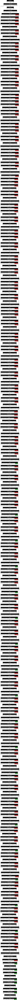

In [22]:
# Set the number of layers to freeze
N = 124

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('convnext_xlarge').layers[:N]):
    layer.trainable = False

# Print layer indices, names, and trainability status
for i, layer in enumerate(ft_model.get_layer('convnext_xlarge').layers):
    print(i, layer.name, layer.trainable)

# Display a summary of the model architecture
ft_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [23]:
# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

In [24]:
# Fine-tune the model
ft_history = ft_model.fit(
    x=aug_images*255, #The model takes inputs in the range 0-255 
    y=aug_labels,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val*255, y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=5, restore_best_weights=True)]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(ft_history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'ft_model_large.keras'
ft_model.save(model_filename)

Epoch 1/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1500s 2s/step - accuracy: 0.8083 - loss: 0.7301 - val_accuracy: 0.9716 - val_loss: 0.1088
Epoch 2/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1469s 2s/step - accuracy: 0.8291 - loss: 0.6701 - val_accuracy: 0.9732 - val_loss: 0.1026
Epoch 3/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1469s 2s/step - accuracy: 0.8380 - loss: 0.6495 - val_accuracy: 0.9783 - val_loss: 0.0923
Epoch 4/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1469s 2s/step - accuracy: 0.8478 - loss: 0.6299 - val_accuracy: 0.9799 - val_loss: 0.0831
Epoch 5/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1469s 2s/step - accuracy: 0.8451 - loss: 0.6239 - val_accuracy: 0.9833 - val_loss: 0.0794
Epoch 6/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1468s 2s/step - accuracy: 0.8490 - loss: 0.6111 - val_accuracy: 0.9799 - val_loss: 0.0749
Epoch 7/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1468s 2s/step - accuracy: 0.8515 - loss: 0.6008 - val_accuracy: 0.9799 - val_loss: 0.0700
Epoch 8/15
673/673 ━━━━━━━━━━━━━━━━━━━━ 1468s 2s/step - accuracy: 0.8559 - loss: 0.5873 - 

598
Accuracy score over the test set: 0.9783
Precision score over the test set: 0.9796
Recall score over the test set: 0.9783
F1 score over the test set: 0.9785


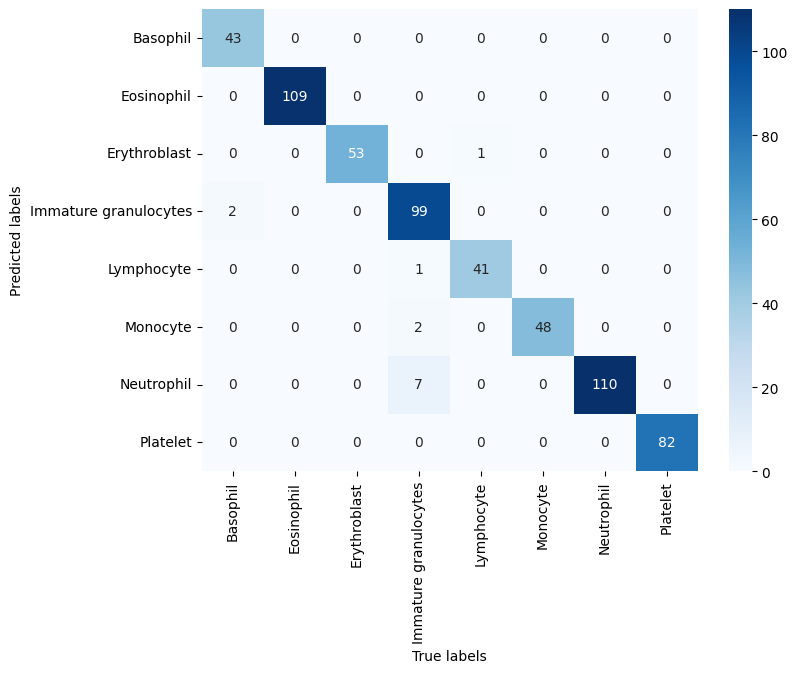

In [25]:
# Predict class probabilities and get predicted classes
test_predictions = ft_model.predict(X_test*255, verbose=0)
print(len(test_predictions))
test_predictions = np.argmax(test_predictions, axis=-1)

# Extract ground truth classes
test_gt = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
test_accuracy = accuracy_score(test_gt, test_predictions)
print(f"Accuracy score over the test set: {round(test_accuracy, 4)}")

# Calculate and display test set precision
test_precision = precision_score(test_gt, test_predictions, average="weighted")
print(f"Precision score over the test set: {round(test_precision, 4)}")

# Calculate and display test set recall
test_recall = recall_score(test_gt, test_predictions, average="weighted")
print(f"Recall score over the test set: {round(test_recall, 4)}")

# Calculate and display test set F1 score
test_f1 = f1_score(test_gt, test_predictions, average="weighted")
print(f"F1 score over the test set: {round(test_f1, 4)}")

# Compute the confusion matrix
cm = confusion_matrix(test_gt, test_predictions)

# Create labels combining confusion matrix values
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix with class labels
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm,
    annot=labels,
    fmt="",
    xticklabels=list(labels_dict.values()),
    yticklabels=list(labels_dict.values()),
    cmap="Blues",
)

plt.xlabel("True labels")
plt.ylabel("Predicted labels")
plt.show()

# Delete the model to free up resources
del ft_model

## 📊 Prepare Your Submission


To prepare your submission, create a `.zip` file that includes all the necessary code to run your model. It **must** include a `model.py` file with the following class:


```python

# file: model.py

class Model:

    def __init__(self):


        """Initialize the internal state of the model."""


    def predict(self, X):


        """Return a numpy array with the labels corresponding to the input X."""

```

The next cell shows an example implementation of the `model.py` file, which includes loading model weights from the `weights.keras` file and conducting predictions on provided input data. The `.zip` file is created and downloaded in the last notebook cell.


❗ Feel free to modify the method implementations to better fit your specific requirements, but please ensure that the class name and method interfaces remain unchanged.

In [26]:
%%writefile model.py

import numpy as np
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl


class Model:

    def __init__(self):

        """
        Initialize the internal state of the model. Note that the __init__
        method cannot accept any arguments.
        The following is an example loading the weights of a pre-trained
        model.
        """

        self.neural_network = tfk.models.load_model('ft_model_large.keras')

    def predict(self, X):

        """
        Predict the labels corresponding to the input X. Note that X is a numpy
        array of shape (n_samples, 96, 96, 3) and the output should be a numpy
        array of shape (n_samples,). Therefore, outputs must no be one-hot
        encoded.
        The following is an example of a prediction from the pre-trained model
        loaded in the __init__ method.
        """

        preds = self.neural_network.predict(X, verbose=0)

        # Get the predicted classes, not the one-hot encoded values
        preds = np.argmax(preds, axis=-1)

        return preds

Writing model.py


In [27]:
model_filename

'ft_model_large.keras'

In [28]:
from datetime import datetime

filename = f'submission_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

# Add files to the zip command if needed
!zip {filename} model.py ft_model_large.keras

# from google.colab import files
# files.download(filename)

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


  adding: model.py (deflated 55%)
  adding: ft_model_large.keras (deflated 7%)


In [29]:
filename

'submission_241122_043300.zip'

In [30]:
%cd /kaggle/working
from IPython.display import FileLink
FileLink(filename)

/kaggle/working


/kaggle/working/submission_241122_043300.zip